# Using the DINO Model 

In [1]:
!pip install timm


In [20]:
pip install umap-learn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 3.8 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


## DINO for Feature Extraction

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import timm  # For DINO models
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder


In [2]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
])

train_dataset = ImageFolder('/kaggle/input/tea-grades-combined/Day 2 and 3 Combined Sampled/Train', transform=transform)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)


In [9]:
model = timm.create_model('vit_base_patch16_224_dino', pretrained=True)
model.head = nn.Identity()  # Remove the classification head for self-supervised learning
model = model.cuda()


In [10]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)


Unfreezing all the layers gave the worst results

In [12]:
from tqdm import tqdm

epochs = 10
for epoch in range(epochs):
    model.train()
    running_loss = 0.0

    print(f"Epoch {epoch+1}/{epochs}")
    with tqdm(total=len(train_loader), desc="Training", unit="batch") as pbar:
        for images, _ in train_loader:
            images = images.cuda()

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, outputs.detach())  # Self-distillation

            # Backward pass
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            # Update the progress bar
            pbar.update(1)
            pbar.set_postfix({"Batch Loss": loss.item()})

    avg_loss = running_loss / len(train_loader)
    print(f"Epoch {epoch+1} Completed: Average Loss: {avg_loss:.4f}\n")


Epoch 1/10


Training: 100%|██████████| 188/188 [03:48<00:00,  1.21s/batch, Batch Loss=-9.85e+3]


Epoch 1 Completed: Average Loss: -9789.8989

Epoch 2/10


Training: 100%|██████████| 188/188 [03:47<00:00,  1.21s/batch, Batch Loss=-9.97e+3]


Epoch 2 Completed: Average Loss: -9914.2627

Epoch 3/10


Training: 100%|██████████| 188/188 [03:47<00:00,  1.21s/batch, Batch Loss=-1.01e+4]


Epoch 3 Completed: Average Loss: -10039.6357

Epoch 4/10


Training: 100%|██████████| 188/188 [03:46<00:00,  1.21s/batch, Batch Loss=-1.02e+4]


Epoch 4 Completed: Average Loss: -10167.6730

Epoch 5/10


Training: 100%|██████████| 188/188 [03:46<00:00,  1.21s/batch, Batch Loss=-1.04e+4]


Epoch 5 Completed: Average Loss: -10298.8915

Epoch 6/10


Training: 100%|██████████| 188/188 [03:47<00:00,  1.21s/batch, Batch Loss=-1.05e+4]


Epoch 6 Completed: Average Loss: -10433.4054

Epoch 7/10


Training: 100%|██████████| 188/188 [03:46<00:00,  1.21s/batch, Batch Loss=-1.06e+4]


Epoch 7 Completed: Average Loss: -10571.6025

Epoch 8/10


Training: 100%|██████████| 188/188 [03:46<00:00,  1.21s/batch, Batch Loss=-1.08e+4]


Epoch 8 Completed: Average Loss: -10713.3188

Epoch 9/10


Training: 100%|██████████| 188/188 [03:47<00:00,  1.21s/batch, Batch Loss=-1.09e+4]


Epoch 9 Completed: Average Loss: -10858.7381

Epoch 10/10


Training: 100%|██████████| 188/188 [03:47<00:00,  1.21s/batch, Batch Loss=-1.11e+4]

Epoch 10 Completed: Average Loss: -11007.5236



In [11]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import numpy as np

# Function to visualize feature embeddings
def visualize_embeddings(model, dataloader, num_samples=200):
    model.eval()
    features, labels = [], []

    # Extract features for a subset of the dataset
    with torch.no_grad():
        for images, lbls in dataloader:
            images = images.cuda()
            outputs = model(images)  # Forward pass
            features.append(outputs.cpu().numpy())
            labels.append(lbls.numpy())
            if len(features) * len(images) >= num_samples:
                break

    # Flatten lists
    features = np.vstack(features)[:num_samples]
    labels = np.hstack(labels)[:num_samples]

    # Use PCA or t-SNE to reduce dimensionality
    #reduced_features = PCA(n_components=2).fit_transform(features)
    # Alternatively, use t-SNE for better separation
    reduced_features = TSNE(n_components=2).fit_transform(features)

    # Plot the embeddings
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=labels, cmap="tab10", s=10)
    plt.colorbar(scatter, label="Classes")
    plt.title("Feature Embedding Visualization")
    plt.xlabel("Dimension 1")
    plt.ylabel("Dimension 2")
    plt.grid()
    plt.show()

# Call the function to visualize



In [ ]:
visualize_embeddings(model, train_loader, num_samples=200)

In [ ]:
from mpl_toolkits.mplot3d import Axes3D  # For 3D plotting

# Function to visualize 3D feature embeddings
def visualize_embeddings_3d(model, dataloader, num_samples=200):
    model.eval()
    features, labels = [], []

    # Extract features for a subset of the dataset
    with torch.no_grad():
        for images, lbls in dataloader:
            images = images.cuda()
            outputs = model(images)  # Forward pass
            features.append(outputs.cpu().numpy())
            labels.append(lbls.numpy())
            if len(features) * len(images) >= num_samples:
                break

    # Flatten lists
    features = np.vstack(features)[:num_samples]
    labels = np.hstack(labels)[:num_samples]

    # Use PCA or t-SNE to reduce dimensionality to 3D
    reduced_features = TSNE(n_components=3).fit_transform(features)
    # For PCA, use: reduced_features = PCA(n_components=3).fit_transform(features)

    # 3D scatter plot
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(
        reduced_features[:, 0],
        reduced_features[:, 1],
        reduced_features[:, 2],
        c=labels,
        cmap="tab10",
        s=15
    )
    ax.set_title("3D Feature Embedding Visualization")
    ax.set_xlabel("Dimension 1")
    ax.set_ylabel("Dimension 2")
    ax.set_zlabel("Dimension 3")
    plt.colorbar(scatter, label="Classes")
    plt.show()

In [4]:
import time
import torch
import timm
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

Unfreezing only last 5 layers

In [3]:


# Define model
model = timm.create_model('vit_base_patch16_224_dino', pretrained=True)

# Freeze all layers except the last transformer blocks and the head
for param in model.parameters():
    param.requires_grad = False

# Unfreeze the last 5 transformer blocks
for param in model.blocks[-5:].parameters():  # Unfreeze the last 5 transformer blocks
    param.requires_grad = True

# Also unfreeze the classifier head (or Identity layer in this case)
for param in model.head.parameters():
    param.requires_grad = True

# Remove the classification head for self-supervised learning
model.head = nn.Identity()

if torch.cuda.device_count() > 1:
    print(f"Using {torch.cuda.device_count()} GPUs!")
    model = nn.DataParallel(model)  # Wrap the model with DataParallel


model = model.cuda()  # Move model to GPU

# Define loss function and optimizer
criterion = nn.MSELoss()  # Mean Squared Error for self-distillation
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)

# Training loop
epochs = 10
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    start_time = time.time()  # Track time for this epoch

    print(f"Epoch {epoch+1}/{epochs}")
    with tqdm(total=len(train_loader), desc="Training", unit="batch") as pbar:
        for images, _ in train_loader:  # No need for labels in self-supervised learning
            images = images.cuda()

            # Forward pass
            outputs = model(images)

            # Self-distillation loss: Compare the model output to its own previous output
            soft_target = outputs.detach()  # This detaches the gradient for self-supervised distillation

            # Compute the loss (using MSE loss between outputs and soft targets)
            loss = criterion(outputs, soft_target)

            # Backward pass
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            # Update progress bar
            pbar.update(1)
            pbar.set_postfix({"Batch Loss": loss.item()})

    # Calculate metrics after the epoch
    avg_loss = running_loss / len(train_loader)
    epoch_time = time.time() - start_time

    print(f"Epoch {epoch+1} Completed:")
    print(f"  Average Loss: {avg_loss:.4f}")
    print(f"  Time taken: {epoch_time:.2f} seconds\n")


/usr/local/lib/python3.10/dist-packages/timm/models/_factory.py:117: UserWarning: Mapping deprecated model name vit_base_patch16_224_dino to current vit_base_patch16_224.dino.
  model = create_fn(


model.safetensors:   0%|          | 0.00/343M [00:00<?, ?B/s]

Using 2 GPUs!
Epoch 1/10


Training: 100%|██████████| 188/188 [01:16<00:00,  2.47batch/s, Batch Loss=0]


Epoch 1 Completed:
  Average Loss: 0.0000
  Time taken: 76.11 seconds

Epoch 2/10


Training: 100%|██████████| 188/188 [01:23<00:00,  2.24batch/s, Batch Loss=0]


Epoch 2 Completed:
  Average Loss: 0.0000
  Time taken: 83.77 seconds

Epoch 3/10


Training: 100%|██████████| 188/188 [01:25<00:00,  2.20batch/s, Batch Loss=0]


Epoch 3 Completed:
  Average Loss: 0.0000
  Time taken: 85.47 seconds

Epoch 4/10


Training: 100%|██████████| 188/188 [01:25<00:00,  2.20batch/s, Batch Loss=0]


Epoch 4 Completed:
  Average Loss: 0.0000
  Time taken: 85.36 seconds

Epoch 5/10


Training: 100%|██████████| 188/188 [01:25<00:00,  2.20batch/s, Batch Loss=0]


Epoch 5 Completed:
  Average Loss: 0.0000
  Time taken: 85.33 seconds

Epoch 6/10


Training: 100%|██████████| 188/188 [01:25<00:00,  2.20batch/s, Batch Loss=0]


Epoch 6 Completed:
  Average Loss: 0.0000
  Time taken: 85.31 seconds

Epoch 7/10


Training: 100%|██████████| 188/188 [01:25<00:00,  2.21batch/s, Batch Loss=0]


Epoch 7 Completed:
  Average Loss: 0.0000
  Time taken: 85.01 seconds

Epoch 8/10


Training: 100%|██████████| 188/188 [01:25<00:00,  2.21batch/s, Batch Loss=0]


Epoch 8 Completed:
  Average Loss: 0.0000
  Time taken: 85.17 seconds

Epoch 9/10


Training: 100%|██████████| 188/188 [01:24<00:00,  2.22batch/s, Batch Loss=0]


Epoch 9 Completed:
  Average Loss: 0.0000
  Time taken: 84.79 seconds

Epoch 10/10


Training: 100%|██████████| 188/188 [01:24<00:00,  2.23batch/s, Batch Loss=0]

Epoch 10 Completed:
  Average Loss: 0.0000
  Time taken: 84.46 seconds



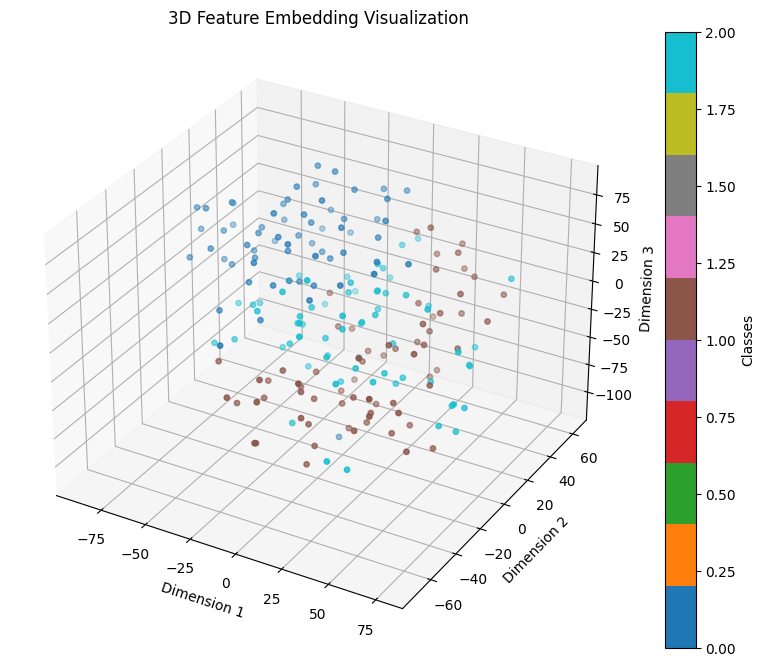

In [8]:
# Call the function to visualize
visualize_embeddings_3d(model, train_loader, num_samples=200)


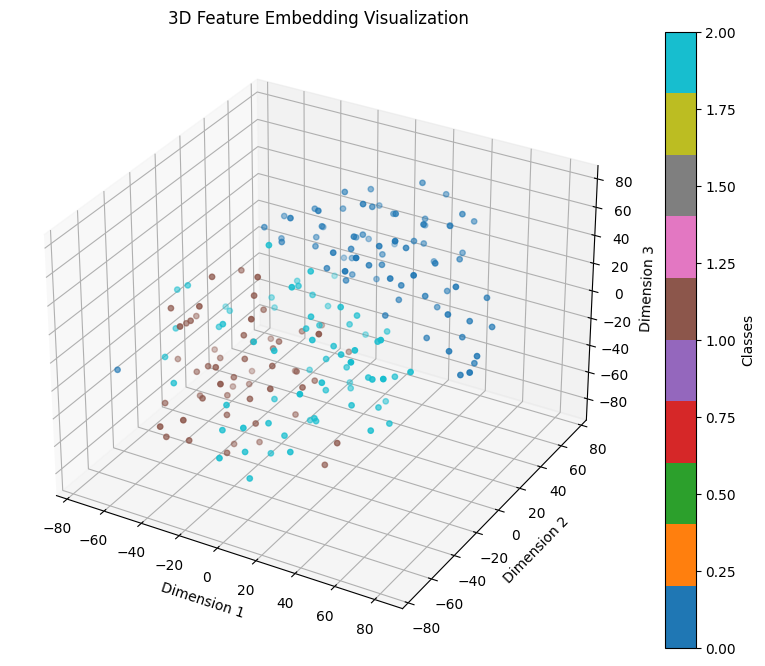

In [16]:
# Call the function to visualize
visualize_embeddings_3d(model, train_loader, num_samples=200)


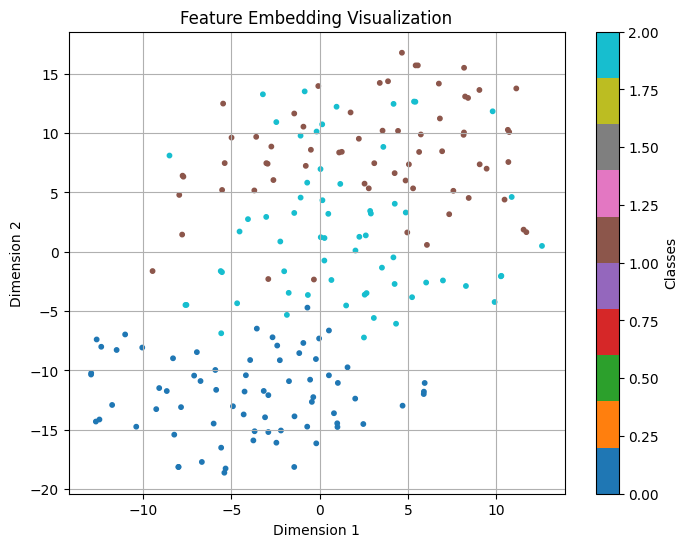

In [15]:
visualize_embeddings(model, train_loader, num_samples=200)

Unfreezing only last 20 layers (Showed poor performance)  

In [21]:
# Define model
model = timm.create_model('vit_base_patch16_224_dino', pretrained=True)

# Freeze all layers except the last transformer blocks and the head
for param in model.parameters():
    param.requires_grad = False

# Unfreeze the last 5 transformer blocks
for param in model.blocks[-20:].parameters():  # Unfreeze the last 5 transformer blocks
    param.requires_grad = True

# Also unfreeze the classifier head (or Identity layer in this case)
for param in model.head.parameters():
    param.requires_grad = True

# Remove the classification head for self-supervised learning
model.head = nn.Identity()

if torch.cuda.device_count() > 1:
    print(f"Using {torch.cuda.device_count()} GPUs!")
    model = nn.DataParallel(model)  # Wrap the model with DataParallel


model = model.cuda()  # Move model to GPU

# Define loss function and optimizer
criterion = nn.MSELoss()  # Mean Squared Error for self-distillation
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)

# Training loop
epochs = 10
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    start_time = time.time()  # Track time for this epoch

    print(f"Epoch {epoch+1}/{epochs}")
    with tqdm(total=len(train_loader), desc="Training", unit="batch") as pbar:
        for images, _ in train_loader:  # No need for labels in self-supervised learning
            images = images.cuda()

            # Forward pass
            outputs = model(images)

            # Self-distillation loss: Compare the model output to its own previous output
            soft_target = outputs.detach()  # This detaches the gradient for self-supervised distillation

            # Compute the loss (using MSE loss between outputs and soft targets)
            loss = criterion(outputs, soft_target)

            # Backward pass
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            # Update progress bar
            pbar.update(1)
            pbar.set_postfix({"Batch Loss": loss.item()})

    # Calculate metrics after the epoch
    avg_loss = running_loss / len(train_loader)
    epoch_time = time.time() - start_time

    print(f"Epoch {epoch+1} Completed:")
    print(f"  Average Loss: {avg_loss:.4f}")
    print(f"  Time taken: {epoch_time:.2f} seconds\n")


Using 2 GPUs!
Epoch 1/10


Training: 100%|██████████| 188/188 [02:02<00:00,  1.54batch/s, Batch Loss=0]


Epoch 1 Completed:
  Average Loss: 0.0000
  Time taken: 122.37 seconds

Epoch 2/10


Training: 100%|██████████| 188/188 [02:01<00:00,  1.55batch/s, Batch Loss=0]


Epoch 2 Completed:
  Average Loss: 0.0000
  Time taken: 121.55 seconds

Epoch 3/10


Training: 100%|██████████| 188/188 [02:01<00:00,  1.55batch/s, Batch Loss=0]


Epoch 3 Completed:
  Average Loss: 0.0000
  Time taken: 121.41 seconds

Epoch 4/10


Training: 100%|██████████| 188/188 [02:01<00:00,  1.55batch/s, Batch Loss=0]


Epoch 4 Completed:
  Average Loss: 0.0000
  Time taken: 121.17 seconds

Epoch 5/10


Training: 100%|██████████| 188/188 [02:01<00:00,  1.55batch/s, Batch Loss=0]


Epoch 5 Completed:
  Average Loss: 0.0000
  Time taken: 121.15 seconds

Epoch 6/10


Training: 100%|██████████| 188/188 [02:00<00:00,  1.55batch/s, Batch Loss=0]


Epoch 6 Completed:
  Average Loss: 0.0000
  Time taken: 120.92 seconds

Epoch 7/10


Training: 100%|██████████| 188/188 [02:00<00:00,  1.56batch/s, Batch Loss=0]


Epoch 7 Completed:
  Average Loss: 0.0000
  Time taken: 120.69 seconds

Epoch 8/10


Training: 100%|██████████| 188/188 [02:00<00:00,  1.56batch/s, Batch Loss=0]


Epoch 8 Completed:
  Average Loss: 0.0000
  Time taken: 120.52 seconds

Epoch 9/10


Training: 100%|██████████| 188/188 [01:59<00:00,  1.57batch/s, Batch Loss=0]


Epoch 9 Completed:
  Average Loss: 0.0000
  Time taken: 119.79 seconds

Epoch 10/10


Training: 100%|██████████| 188/188 [01:59<00:00,  1.58batch/s, Batch Loss=0]

Epoch 10 Completed:
  Average Loss: 0.0000
  Time taken: 119.06 seconds



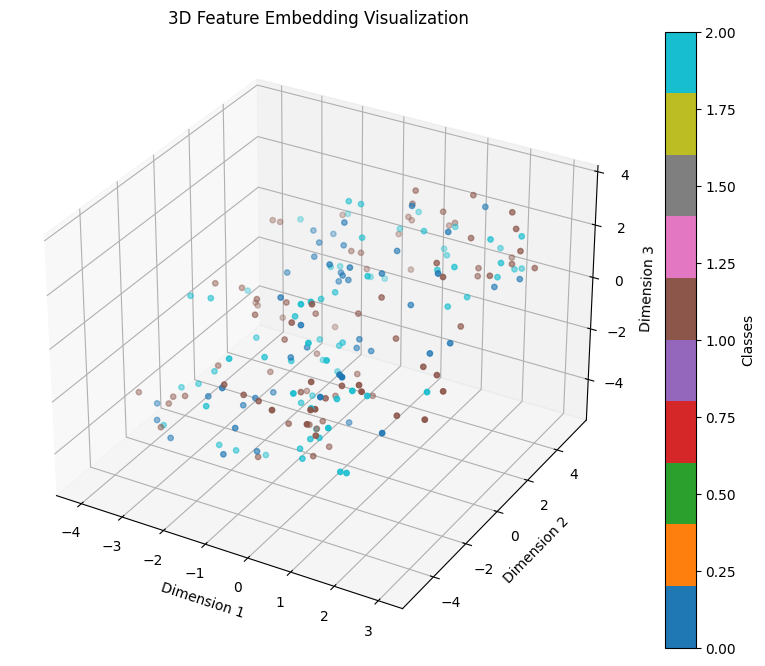

In [23]:
# Call the function to visualize
visualize_embeddings_3d(model, train_loader, num_samples=200)


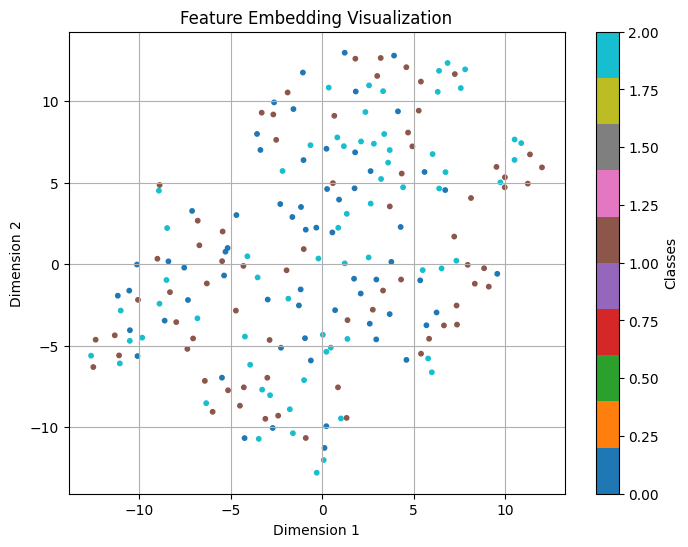

In [24]:
visualize_embeddings(model, train_loader, num_samples=200)

Unfreezing 2 layers

In [5]:
# Define model
model = timm.create_model('vit_base_patch16_224_dino', pretrained=True)

# Freeze all layers except the last transformer blocks and the head
for param in model.parameters():
    param.requires_grad = False

# Unfreeze the last 5 transformer blocks
for param in model.blocks[-2:].parameters():  # Unfreeze the last 5 transformer blocks
    param.requires_grad = True

# Also unfreeze the classifier head (or Identity layer in this case)
for param in model.head.parameters():
    param.requires_grad = True

# Remove the classification head for self-supervised learning
model.head = nn.Identity()

if torch.cuda.device_count() > 1:
    print(f"Using {torch.cuda.device_count()} GPUs!")
    model = nn.DataParallel(model)  # Wrap the model with DataParallel


model = model.cuda()  # Move model to GPU

# Define loss function and optimizer
criterion = nn.MSELoss()  # Mean Squared Error for self-distillation
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)

# Training loop
epochs = 10
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    start_time = time.time()  # Track time for this epoch

    print(f"Epoch {epoch+1}/{epochs}")
    with tqdm(total=len(train_loader), desc="Training", unit="batch") as pbar:
        for images, _ in train_loader:  # No need for labels in self-supervised learning
            images = images.cuda()

            # Forward pass
            outputs = model(images)

            # Self-distillation loss: Compare the model output to its own previous output
            soft_target = outputs.detach()  # This detaches the gradient for self-supervised distillation

            # Compute the loss (using MSE loss between outputs and soft targets)
            loss = criterion(outputs, soft_target)

            # Backward pass
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            # Update progress bar
            pbar.update(1)
            pbar.set_postfix({"Batch Loss": loss.item()})

    # Calculate metrics after the epoch
    avg_loss = running_loss / len(train_loader)
    epoch_time = time.time() - start_time

    print(f"Epoch {epoch+1} Completed:")
    print(f"  Average Loss: {avg_loss:.4f}")
    print(f"  Time taken: {epoch_time:.2f} seconds\n")


Using 2 GPUs!
Epoch 1/10


Training: 100%|██████████| 188/188 [00:59<00:00,  3.15batch/s, Batch Loss=0]


Epoch 1 Completed:
  Average Loss: 0.0000
  Time taken: 59.68 seconds

Epoch 2/10


Training: 100%|██████████| 188/188 [01:01<00:00,  3.05batch/s, Batch Loss=0]


Epoch 2 Completed:
  Average Loss: 0.0000
  Time taken: 61.71 seconds

Epoch 3/10


Training: 100%|██████████| 188/188 [01:05<00:00,  2.89batch/s, Batch Loss=0]


Epoch 3 Completed:
  Average Loss: 0.0000
  Time taken: 65.09 seconds

Epoch 4/10


Training: 100%|██████████| 188/188 [01:05<00:00,  2.89batch/s, Batch Loss=0]


Epoch 4 Completed:
  Average Loss: 0.0000
  Time taken: 65.09 seconds

Epoch 5/10


Training: 100%|██████████| 188/188 [01:05<00:00,  2.88batch/s, Batch Loss=0]


Epoch 5 Completed:
  Average Loss: 0.0000
  Time taken: 65.21 seconds

Epoch 6/10


Training: 100%|██████████| 188/188 [01:05<00:00,  2.88batch/s, Batch Loss=0]


Epoch 6 Completed:
  Average Loss: 0.0000
  Time taken: 65.39 seconds

Epoch 7/10


Training: 100%|██████████| 188/188 [01:05<00:00,  2.88batch/s, Batch Loss=0]


Epoch 7 Completed:
  Average Loss: 0.0000
  Time taken: 65.25 seconds

Epoch 8/10


Training: 100%|██████████| 188/188 [01:05<00:00,  2.88batch/s, Batch Loss=0]


Epoch 8 Completed:
  Average Loss: 0.0000
  Time taken: 65.27 seconds

Epoch 9/10


Training: 100%|██████████| 188/188 [01:05<00:00,  2.88batch/s, Batch Loss=0]


Epoch 9 Completed:
  Average Loss: 0.0000
  Time taken: 65.26 seconds

Epoch 10/10


Training: 100%|██████████| 188/188 [01:05<00:00,  2.89batch/s, Batch Loss=0]

Epoch 10 Completed:
  Average Loss: 0.0000
  Time taken: 65.00 seconds



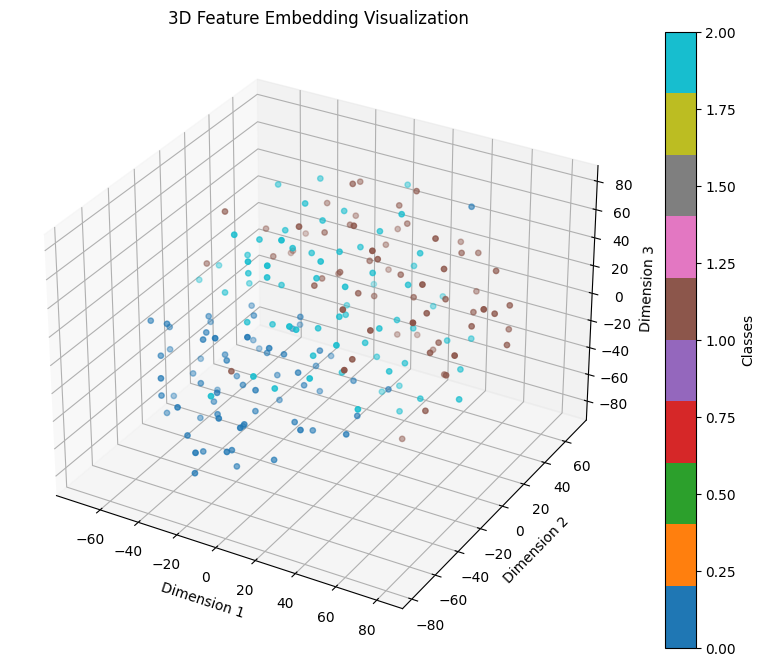

In [12]:
# Call the function to visualize
visualize_embeddings_3d(model, train_loader, num_samples=200)


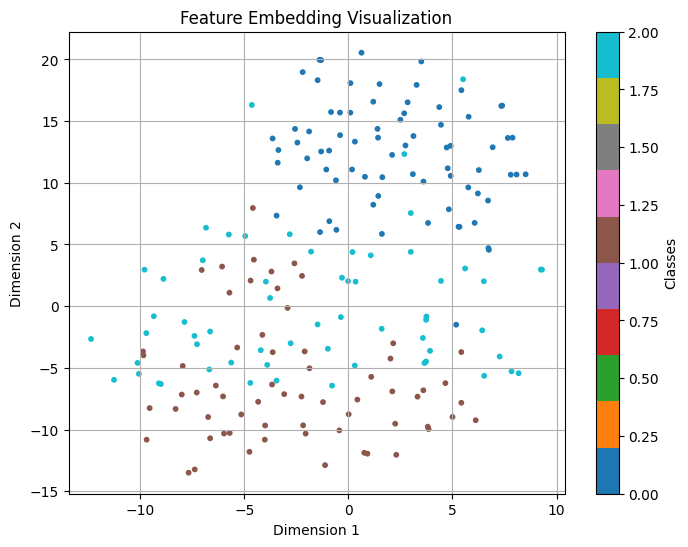

In [16]:
visualize_embeddings(model, train_loader, num_samples=400)

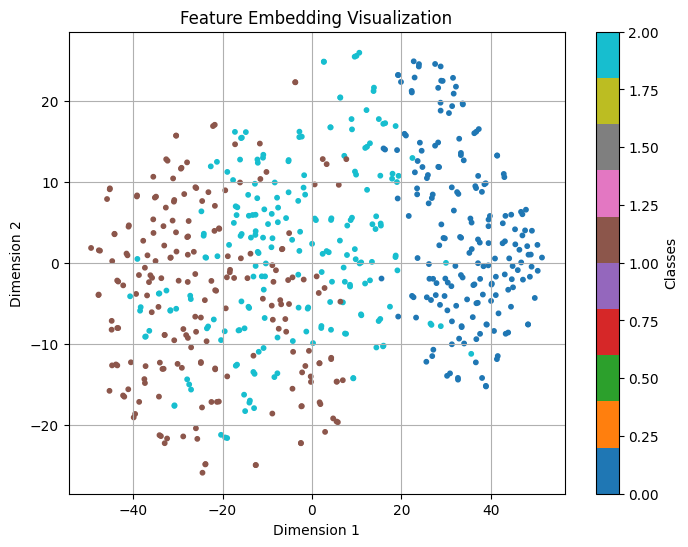

In [19]:
visualize_embeddings(model, train_loader, num_samples=600)

Dimension does not depict the same feature

Using UMAP for dimensionality reduction

In [22]:
import umap.umap_ as umap  # Import UMAP for dimensionality reduction
import torch
import numpy as np
import matplotlib.pyplot as plt

# Function to visualize 3D feature embeddings using UMAP
def visualize_embeddings_3d_umap(model, dataloader, num_samples=200):
    model.eval()
    features, labels = [], []

    # Extract features for a subset of the dataset
    with torch.no_grad():
        for images, lbls in dataloader:
            images = images.cuda()
            outputs = model(images)  # Forward pass
            features.append(outputs.cpu().numpy())
            labels.append(lbls.numpy())
            if len(features) * len(images) >= num_samples:
                break

    # Flatten lists
    features = np.vstack(features)[:num_samples]
    labels = np.hstack(labels)[:num_samples]

    # Apply UMAP to reduce dimensionality to 3D
    reducer = umap.UMAP(n_components=3, random_state=42)
    reduced_features = reducer.fit_transform(features)

    # 3D scatter plot
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(
        reduced_features[:, 0],
        reduced_features[:, 1],
        reduced_features[:, 2],
        c=labels,
        cmap="tab10",
        s=15
    )
    ax.set_title("3D Feature Embedding Visualization (UMAP)")
    ax.set_xlabel("Dimension 1")
    ax.set_ylabel("Dimension 2")
    ax.set_zlabel("Dimension 3")
    plt.colorbar(scatter, label="Classes")
    plt.show()


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


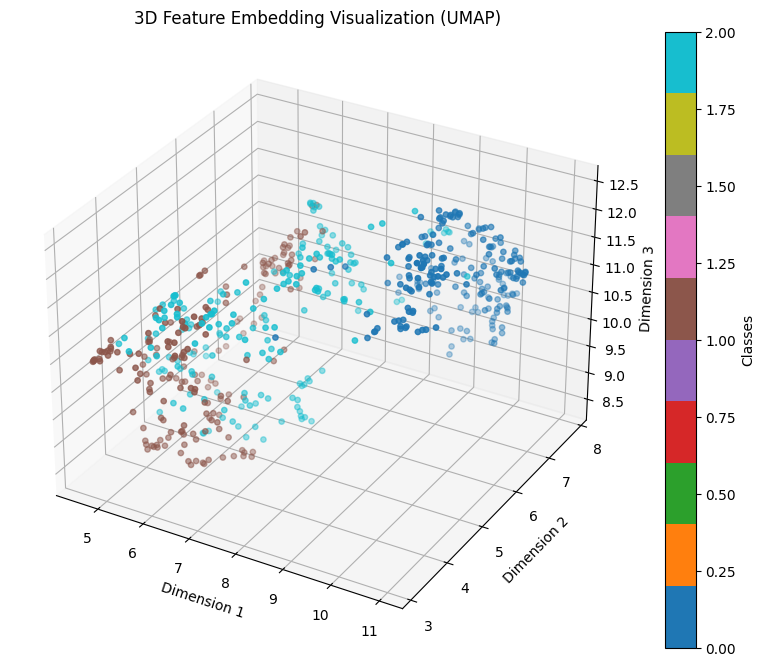

In [29]:
# Call the function to visualize
visualize_embeddings_3d_umap(model, train_loader, num_samples=600)


In [40]:
import umap.umap_ as umap
import torch
import numpy as np
import matplotlib.pyplot as plt
from random import sample

# Function to visualize 2D feature embeddings using UMAP
def visualize_embeddings_2d_umap_random(model, dataloader, num_samples=200):
    model.eval()
    features, labels = [], []
    
    # Create a list of all dataset indices
    all_samples = []
    all_labels = []

    # Extract features and labels for the entire dataset
    with torch.no_grad():
        for images, lbls in dataloader:
            images = images.cuda()
            outputs = model(images)  # Forward pass
            all_samples.append(outputs.cpu().numpy())
            all_labels.append(lbls.numpy())

    # Flatten the accumulated samples and labels
    all_samples = np.vstack(all_samples)
    all_labels = np.hstack(all_labels)

    # Randomly sample `num_samples` from the dataset
    indices = sample(range(len(all_samples)), num_samples)
    selected_features = all_samples[indices]
    selected_labels = all_labels[indices]

    # Apply UMAP to reduce dimensionality to 2D
    reducer = umap.UMAP(n_components=2, random_state=42)
    reduced_features = reducer.fit_transform(selected_features)

    # 2D scatter plot
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(
        reduced_features[:, 0],
        reduced_features[:, 1],
        c=selected_labels,
        cmap="tab10",
        s=15
    )
    plt.title("2D Feature Embedding Visualization (UMAP)")
    plt.xlabel("Dimension 1")
    plt.ylabel("Dimension 2")
    plt.colorbar(scatter, label="Classes")
    plt.show()


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


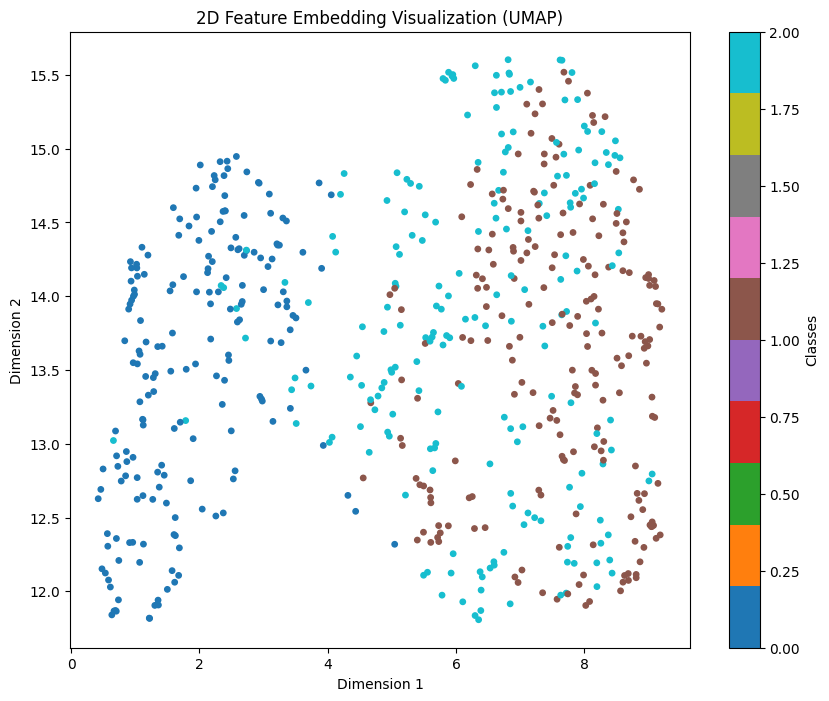

In [28]:
# Call the function to visualize
visualize_embeddings_2d_umap(model, train_loader, num_samples=600)

On validaion data set

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


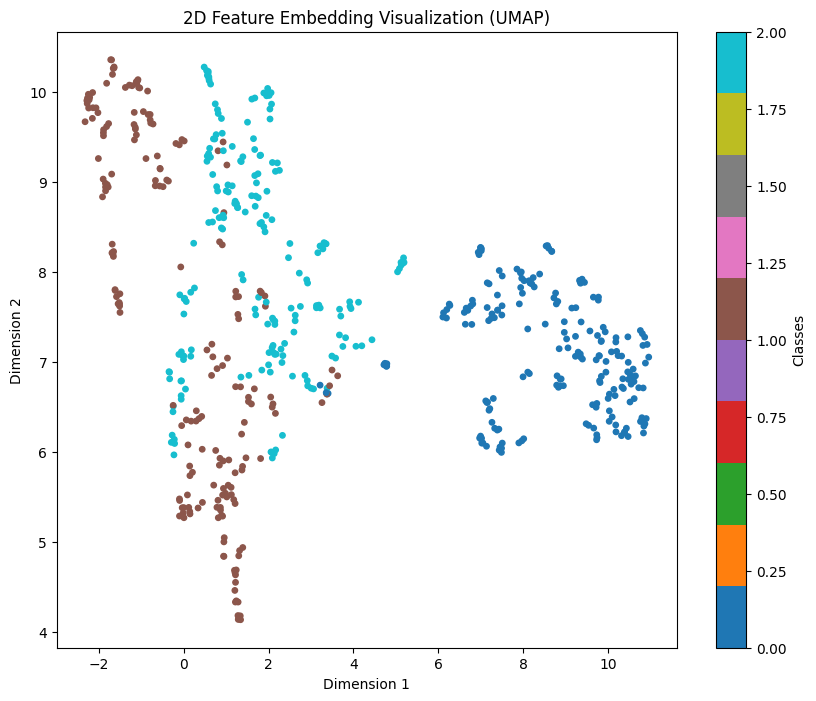

In [42]:
visualize_embeddings_2d_umap_random(model, val_loader, num_samples=600)

## **DINO for classification**


In [36]:
import timm
import torch
import torch.nn as nn
from torch.optim import Adam
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
import os
from torchvision import datasets, transforms, models

In [37]:
# Parameters
img_height = 224
img_width = 224
batch_size = 32

# Define the transformations for training and validation
train_transforms = transforms.Compose([
    transforms.Resize((img_height, img_width)),
    transforms.ToTensor(),
])

val_transforms = transforms.Compose([
    transforms.Resize((img_height, img_width)),
    transforms.ToTensor(),
])

# Base directory
data_dir = '/kaggle/input/tea-grades-combined/Day 2 and 3 Combined Sampled/'

# Load datasets
train_dir = os.path.join(data_dir, 'Train')
val_dir = os.path.join(data_dir, 'Val')

train_dataset = datasets.ImageFolder(root=train_dir, transform=train_transforms)
val_dataset = datasets.ImageFolder(root=val_dir, transform=val_transforms)

# Create DataLoaders for training and validation datasets
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Verify class-to-index mapping (optional)
print("Class to index mapping:", train_dataset.class_to_idx)

num_classes = len(train_dataset.class_to_idx)
print("Number of classes:", num_classes)

Class to index mapping: {'OP1_Sampled': 0, 'OPA_Sampled': 1, 'OP_Sampled': 2}
Number of classes: 3


In [3]:
# Create DINO ViT model
model = timm.create_model('vit_base_patch16_224_dino', pretrained=True)

# Replace the classification head (Identity) with a new linear layer for classification
# The last feature dimension of the transformer output is 768
model.head = nn.Linear(model.embed_dim, num_classes)

# Move the model to the appropriate device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

/usr/local/lib/python3.10/dist-packages/timm/models/_factory.py:117: UserWarning: Mapping deprecated model name vit_base_patch16_224_dino to current vit_base_patch16_224.dino.
  model = create_fn(


model.safetensors:   0%|          | 0.00/343M [00:00<?, ?B/s]

In [17]:
# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = Adam(model.parameters())

# Initialize variables to track performance
best_val_loss = float('inf')


Unfreezing last 10 layers of the DINO block

In [20]:
model = timm.create_model('vit_base_patch16_224_dino', pretrained=True)

# Unfreeze the last 20 layers of the ViT model
for param in model.parameters():
    param.requires_grad = False  # Freeze all layers initially

# Unfreeze the last 20 transformer blocks
num_blocks = len(model.blocks)  # Get total number of transformer blocks
unfreeze_start = num_blocks - 10  # Start unfreezing from the last 10 blocks

for block in model.blocks[unfreeze_start:]:
    for param in block.parameters():
        param.requires_grad = True  # Unfreeze the parameters of the last 20 blocks

# Also, unfreeze the classification head since you need to train it
for param in model.head.parameters():
    param.requires_grad = True

# Replace the classification head for the correct number of classes
model.head = nn.Linear(model.embed_dim, num_classes)

In [21]:
from tqdm import tqdm

# Move model to device
device = torch.device("cuda")
model = model.to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = Adam(filter(lambda p: p.requires_grad, model.parameters()))

# Initialize variables to track performance
best_val_loss = float('inf')

# Training loop
for epoch in range(10):
    model.train()  # Set model to training mode
    train_loss = 0
    correct_preds = 0
    total_preds = 0

    # Training phase with progress bar
    for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{10} - Training", total=len(train_loader)):
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        correct_preds += torch.sum(preds == labels).item()
        total_preds += labels.size(0)

    train_loss /= total_preds
    train_accuracy = correct_preds / total_preds

    model.eval()  # Set model to evaluation mode
    val_loss = 0
    correct_preds = 0
    total_preds = 0

    # Validation phase with progress bar
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc=f"Epoch {epoch+1}/{10} - Validation", total=len(val_loader)):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct_preds += torch.sum(preds == labels).item()
            total_preds += labels.size(0)

    val_loss /= total_preds
    val_accuracy = correct_preds / total_preds

    print(f"Epoch {epoch+1}/5 - Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, "
          f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}")

    # Save the best model based on validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), 'best_model.pth')


Epoch 1/10 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.84it/s]


Epoch 1/5 - Train Loss: 1.4514, Train Accuracy: 0.3300, Validation Loss: 1.1251, Validation Accuracy: 0.3333


Epoch 2/10 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.84it/s]


Epoch 2/5 - Train Loss: 1.0512, Train Accuracy: 0.4342, Validation Loss: 1.0334, Validation Accuracy: 0.4860


Epoch 3/10 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.81it/s]


Epoch 3/5 - Train Loss: 0.8354, Train Accuracy: 0.5755, Validation Loss: 0.7846, Validation Accuracy: 0.6133


Epoch 4/10 - Validation: 100%|██████████| 47/47 [00:26<00:00,  1.81it/s]


Epoch 4/5 - Train Loss: 0.6891, Train Accuracy: 0.6625, Validation Loss: 0.8846, Validation Accuracy: 0.5700


Epoch 5/10 - Validation: 100%|██████████| 47/47 [00:26<00:00,  1.79it/s]


Epoch 5/5 - Train Loss: 0.5977, Train Accuracy: 0.7207, Validation Loss: 0.8112, Validation Accuracy: 0.6053


Epoch 6/10 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.81it/s]


Epoch 6/5 - Train Loss: 0.5455, Train Accuracy: 0.7420, Validation Loss: 0.6732, Validation Accuracy: 0.6693


Epoch 7/10 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.84it/s]


Epoch 7/5 - Train Loss: 0.4778, Train Accuracy: 0.7820, Validation Loss: 0.5864, Validation Accuracy: 0.7093


Epoch 8/10 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.84it/s]


Epoch 8/5 - Train Loss: 0.4253, Train Accuracy: 0.8142, Validation Loss: 0.5970, Validation Accuracy: 0.7047


Epoch 9/10 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.83it/s]


Epoch 9/5 - Train Loss: 0.4345, Train Accuracy: 0.8088, Validation Loss: 0.7214, Validation Accuracy: 0.6800


Epoch 10/10 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.83it/s]


Epoch 10/5 - Train Loss: 0.3937, Train Accuracy: 0.8288, Validation Loss: 0.5752, Validation Accuracy: 0.7440


In [24]:
model = timm.create_model('vit_base_patch16_224_dino', pretrained=True)

# Unfreeze the last 20 layers of the ViT model
for param in model.parameters():
    param.requires_grad = False  # Freeze all layers initially

# Unfreeze the last 20 transformer blocks
num_blocks = len(model.blocks)  # Get total number of transformer blocks
unfreeze_start = num_blocks - 20  # Start unfreezing from the last 20 blocks

for block in model.blocks[unfreeze_start:]:
    for param in block.parameters():
        param.requires_grad = True  # Unfreeze the parameters of the last 20 blocks

# Also, unfreeze the classification head since you need to train it
for param in model.head.parameters():
    param.requires_grad = True

# Replace the classification head for the correct number of classes
model.head = nn.Linear(model.embed_dim, num_classes)

In [25]:
from tqdm import tqdm



# Initialize variables to track performance
best_val_loss = float('inf')

# Training loop
for epoch in range(15):
    model.train()  # Set model to training mode
    train_loss = 0
    correct_preds = 0
    total_preds = 0

    # Training phase with progress bar
    for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{15} - Training", total=len(train_loader)):
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        correct_preds += torch.sum(preds == labels).item()
        total_preds += labels.size(0)

    train_loss /= total_preds
    train_accuracy = correct_preds / total_preds

    model.eval()  # Set model to evaluation mode
    val_loss = 0
    correct_preds = 0
    total_preds = 0

    # Validation phase with progress bar
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc=f"Epoch {epoch+1}/{15} - Validation", total=len(val_loader)):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct_preds += torch.sum(preds == labels).item()
            total_preds += labels.size(0)

    val_loss /= total_preds
    val_accuracy = correct_preds / total_preds

    print(f"Epoch {epoch+1}/15 - Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, "
          f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}")

    # Save the best model based on validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), 'best_model.pth')


Epoch 1/15 - Validation: 100%|██████████| 47/47 [00:27<00:00,  1.69it/s]


Epoch 1/15 - Train Loss: 1.4117, Train Accuracy: 0.4373, Validation Loss: 0.6628, Validation Accuracy: 0.6940


Epoch 2/15 - Validation: 100%|██████████| 47/47 [00:26<00:00,  1.76it/s]


Epoch 2/15 - Train Loss: 0.5506, Train Accuracy: 0.7420, Validation Loss: 0.4786, Validation Accuracy: 0.7780


Epoch 3/15 - Validation: 100%|██████████| 47/47 [00:26<00:00,  1.79it/s]


Epoch 3/15 - Train Loss: 0.3954, Train Accuracy: 0.8298, Validation Loss: 0.4416, Validation Accuracy: 0.8113


Epoch 4/15 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.84it/s]


Epoch 4/15 - Train Loss: 0.3155, Train Accuracy: 0.8660, Validation Loss: 0.4810, Validation Accuracy: 0.8113


Epoch 5/15 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.84it/s]


Epoch 5/15 - Train Loss: 0.2768, Train Accuracy: 0.8910, Validation Loss: 0.7558, Validation Accuracy: 0.7313


Epoch 6/15 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.82it/s]


Epoch 6/15 - Train Loss: 0.2546, Train Accuracy: 0.8995, Validation Loss: 0.4233, Validation Accuracy: 0.8420


Epoch 7/15 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.84it/s]


Epoch 7/15 - Train Loss: 0.2209, Train Accuracy: 0.9162, Validation Loss: 0.4396, Validation Accuracy: 0.8387


Epoch 8/15 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.85it/s]


Epoch 8/15 - Train Loss: 0.2013, Train Accuracy: 0.9220, Validation Loss: 0.4120, Validation Accuracy: 0.8380


Epoch 9/15 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.84it/s]


Epoch 9/15 - Train Loss: 0.1920, Train Accuracy: 0.9245, Validation Loss: 0.6414, Validation Accuracy: 0.8007


Epoch 10/15 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.83it/s]


Epoch 10/15 - Train Loss: 0.1443, Train Accuracy: 0.9485, Validation Loss: 0.5016, Validation Accuracy: 0.8333


Epoch 11/15 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.86it/s]


Epoch 11/15 - Train Loss: 0.1218, Train Accuracy: 0.9527, Validation Loss: 0.4510, Validation Accuracy: 0.8560


Epoch 12/15 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.84it/s]


Epoch 12/15 - Train Loss: 0.1303, Train Accuracy: 0.9518, Validation Loss: 0.4763, Validation Accuracy: 0.8367


Epoch 13/15 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.83it/s]


Epoch 13/15 - Train Loss: 0.1435, Train Accuracy: 0.9440, Validation Loss: 0.4758, Validation Accuracy: 0.8360


Epoch 14/15 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.85it/s]


Epoch 14/15 - Train Loss: 0.1292, Train Accuracy: 0.9488, Validation Loss: 0.3758, Validation Accuracy: 0.8680


Epoch 15/15 - Validation: 100%|██████████| 47/47 [00:25<00:00,  1.81it/s]

Epoch 15/15 - Train Loss: 0.1140, Train Accuracy: 0.9585, Validation Loss: 0.5873, Validation Accuracy: 0.8193


Unfreezing 40 layers performed poorly

In [39]:
import torch
import timm
import torch.nn as nn

# Define the number of classes in your problem
num_classes = 10  # Example, replace with your actual number of classes

# Load the pre-trained model
model = timm.create_model('vit_base_patch16_224_dino', pretrained=True)

# Unfreeze the last 20 transformer blocks
for param in model.parameters():
    param.requires_grad = False  # Freeze all layers initially

# Unfreeze the last 20 transformer blocks
num_blocks = len(model.blocks)  # Get total number of transformer blocks
unfreeze_start = num_blocks - 20  # Start unfreezing from the last 20 blocks

for block in model.blocks[unfreeze_start:]:
    for param in block.parameters():
        param.requires_grad = True  # Unfreeze the parameters of the last 20 blocks

# Also, unfreeze the classification head since you need to train it
for param in model.head.parameters():
    param.requires_grad = True

# Replace the classification head for the correct number of classes
model.head = nn.Linear(model.embed_dim, num_classes)

# Load the checkpoint
checkpoint = torch.load('best_model.pth', weights_only=True)

# Remove 'module.' prefix from the state_dict keys
checkpoint = {k.replace('module.', ''): v for k, v in checkpoint.items()}

# Remove the 'head' keys (classification layer weights) from the checkpoint
checkpoint = {k: v for k, v in checkpoint.items() if 'head' not in k}

# Load the modified state_dict into the model
model.load_state_dict(checkpoint, strict=False)

# Ensure the model is in evaluation mode
model.eval()

# Now the model is ready for feature extraction or further training


VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (patch_drop): Identity()
  (norm_pre): Identity()
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (q_norm): Identity()
        (k_norm): Identity()
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): Identity()
      (drop_path1): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (drop1): Dropout(p=0.0, inplace=False)
        (norm): Identity(

#### Extracting the features from the penultimate layer

In [41]:
def extract_features(model, dataloader, device):
    features_list = []
    labels_list = []
    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            features = model(images)  # Forward pass, features from the penultimate layer
            features_list.append(features.cpu())  # Move to CPU for storing
            labels_list.append(labels.cpu())
    features = torch.cat(features_list, dim=0)
    labels = torch.cat(labels_list, dim=0)
    return features, labels



# Extract features
features, labels = extract_features(model, val_loader, device)

# Now `features` contains the feature vectors (before classification layer)

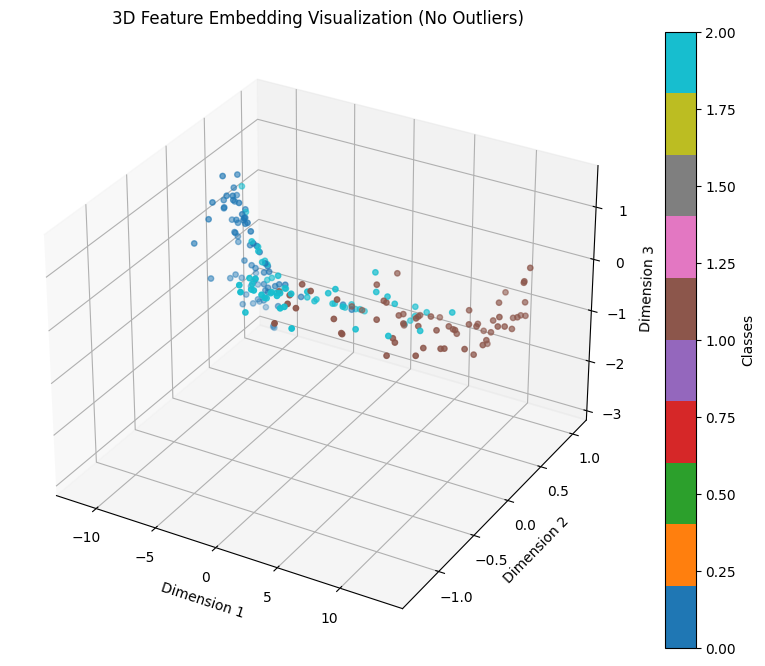

In [50]:

visualize_embeddings_3d_no_outliers(model, train_loader, num_samples=200)


### Using Random for classification on the extracted features 

In [51]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Convert features and labels to numpy arrays
features_np = features.cpu().numpy()  # Convert to NumPy array
labels_np = labels.cpu().numpy()  # Convert to NumPy array

# Train a Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(features_np, labels_np)

# Predict on the same data (or use a separate test set)
predictions = clf.predict(features_np)

# Calculate accuracy (if you have a test set, use test_loader instead)
accuracy = accuracy_score(labels_np, predictions)
print(f"Accuracy: {accuracy * 100:.2f}%")


Accuracy: 100.00%


Showing some results 

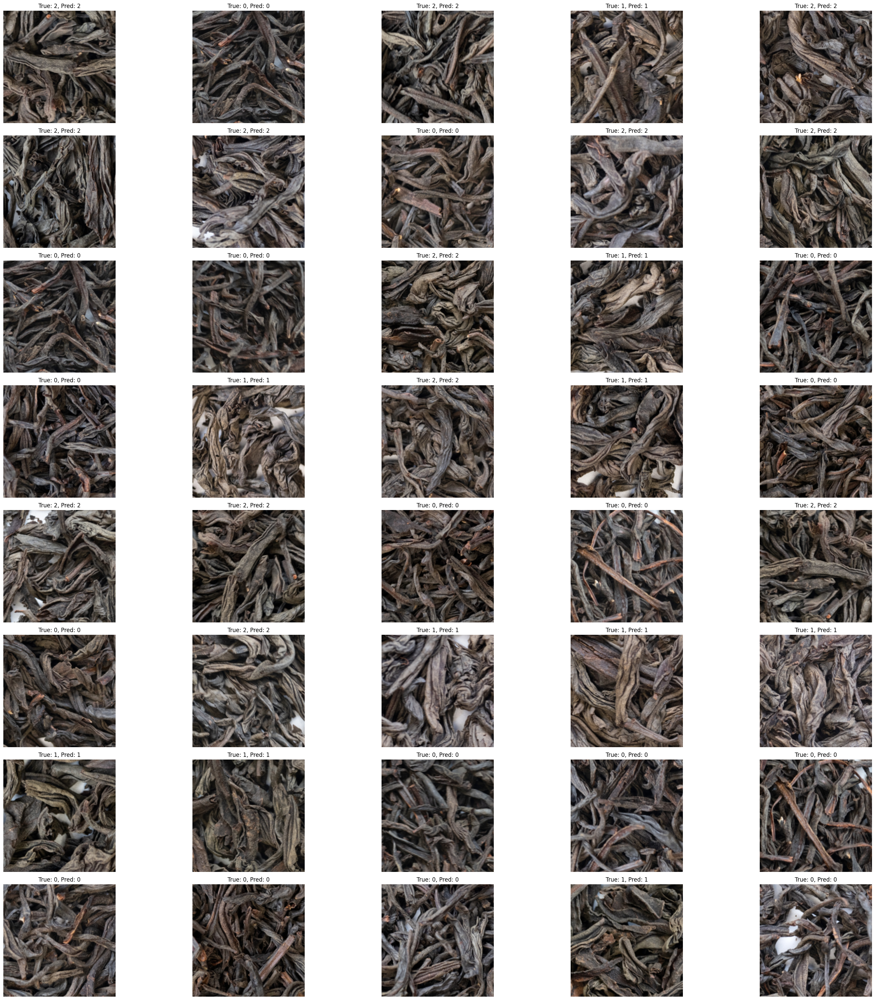

In [58]:
import numpy as np
import matplotlib.pyplot as plt

# Predict on the validation set
predictions = clf.predict(features_np)

# Number of images to show
num_images_to_show = 40
num_columns = 5  # Set the number of columns
num_rows = num_images_to_show // num_columns  # Calculate the number of rows needed

# Create the subplots grid
fig, axes = plt.subplots(num_rows, num_columns, figsize=(30, 30))

# Generate random indices for images to show
random_indices = np.random.choice(len(val_loader.dataset), num_images_to_show, replace=False)

# Loop through random images in the validation set
for i, idx in enumerate(random_indices):
    row = i // num_columns  # Calculate the row index
    col = i % num_columns  # Calculate the column index

    # Get the image and its true label
    img = val_loader.dataset[idx][0].cpu().numpy().transpose(1, 2, 0)  # Get image from the dataset and convert to HxWxC format
    true_label = labels_np[idx]
    predicted_label = predictions[idx]

    # Plot the image
    ax = axes[row, col]
    ax.imshow(img)
    ax.set_title(f"True: {true_label}, Pred: {predicted_label}")
    ax.axis('off')  # Turn off axis

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()
